In [36]:
# Setup: paths, shared parameters, helpers
from pathlib import Path
import numpy as np
import cv2
import imageio
import matplotlib.pyplot as plt
from IPython.display import Video, display, Image

# Change only this line to point at your clip — outputs use the file's parent folder.
INPUT_VIDEO = Path("dataset/climbing_pipeline/shaky.mp4")


def resolve_video_path(p: Path) -> Path:
    """Find the file even if the kernel cwd is repo root while video lives under prototype/."""
    p = Path(p)
    if p.is_absolute() and p.is_file():
        return p.resolve()
    cwd = Path.cwd()
    for base in (cwd, cwd / "prototype", cwd.parent / "prototype"):
        cand = (base / p).resolve()
        if cand.is_file():
            return cand
    raise FileNotFoundError(
        f"Video not found: {p}\n"
        f"  cwd={cwd}\n"
        f"  Tried: {cwd / p}, {cwd / 'prototype' / p}, …\n"
        f"  Set INPUT_VIDEO to an existing path (see list above)."
    )


VIDEO_PATH = resolve_video_path(INPUT_VIDEO)
RUN_DIR = VIDEO_PATH.parent
STEM = VIDEO_PATH.stem
RUN_DIR.mkdir(parents=True, exist_ok=True)

_cap_chk = cv2.VideoCapture(str(VIDEO_PATH))
_ok_chk, _ = _cap_chk.read()
_cap_chk.release()
if not _ok_chk:
    raise RuntimeError(
        f"OpenCV read zero frames from:\n  {VIDEO_PATH}\n"
        "Corrupt/empty file, unsupported codec in this OpenCV build, or wrong path."
    )

MAX_CORNERS = 200
QUALITY_LEVEL = 0.01
MIN_DISTANCE = 10
LK_PARAMS = dict(
    winSize=(21, 21),
    maxLevel=3,
    criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 30, 0.01),
)
PATH_SMOOTH_SIGMA_FRAMES = 12.0
INLIER_THRESH_PX = 3.0  # RANSAC / inlier scoring (pixels)
IMAGEIO_KW = dict(
    codec="libopenh264",
    macro_block_size=1,
    output_params=["-profile:v", "77", "-rc_mode", "off"],
)


def stage_dir(n: int, title: str) -> Path:
    d = RUN_DIR / f"Stage {n} - {title}"
    d.mkdir(parents=True, exist_ok=True)
    return d


def save_mp4_rgb(frames, path: Path, fps: float) -> None:
    path.parent.mkdir(parents=True, exist_ok=True)
    imageio.mimsave(str(path), frames, fps=fps, **IMAGEIO_KW)


def show_video(path: Path) -> None:
    display(Video(str(path)))


def to_3x3(M):
    if M is None:
        return np.eye(3)
    return np.vstack([M.astype(np.float64), [0, 0, 1]])


def to_2x3(M):
    return M[:2]


def gaussian_smooth1d(x, sigma):
    x = np.asarray(x, dtype=np.float64)
    if sigma <= 0:
        return x.copy()
    r = max(1, int(3 * sigma))
    t = np.arange(-r, r + 1, dtype=np.float64)
    k = np.exp(-(t ** 2) / (2 * sigma ** 2))
    k /= k.sum()
    xp = np.pad(x, r, mode="edge")
    return np.convolve(xp, k, mode="valid")


def similarity_Qs_from_cumulative_Rs(Rs, smooth_sigma):
    tx = np.array([float(R[0, 2]) for R in Rs])
    ty = np.array([float(R[1, 2]) for R in Rs])
    th = np.unwrap(np.array([np.arctan2(float(R[1, 0]), float(R[0, 0])) for R in Rs]))
    sc = np.array([np.hypot(float(R[0, 0]), float(R[1, 0])) for R in Rs])
    log_sc = np.log(np.maximum(sc, 1e-9))
    tx_s = gaussian_smooth1d(tx, smooth_sigma)
    ty_s = gaussian_smooth1d(ty, smooth_sigma)
    th_s = gaussian_smooth1d(th, smooth_sigma)
    log_sc_s = gaussian_smooth1d(log_sc, smooth_sigma)
    sc_s = np.exp(log_sc_s)
    Qs = []
    for i in range(len(Rs)):
        c, s = np.cos(th_s[i]), np.sin(th_s[i])
        q = np.array(
            [
                [sc_s[i] * c, -sc_s[i] * s, tx_s[i]],
                [sc_s[i] * s, sc_s[i] * c, ty_s[i]],
                [0.0, 0.0, 1.0],
            ],
            dtype=np.float64,
        )
        Qs.append(q)
    return Qs


def adaptive_crop_from_warps(Ms, w, h, min_area_frac=0.72, fallback_margin=0.05):
    if not Ms:
        m = fallback_margin
        return int(w * m), int(h * m), int(w * (1 - m)), int(h * (1 - m))
    xmin, xmax, ymin, ymax = -np.inf, np.inf, -np.inf, np.inf
    corners_h = np.array([[0, 0, 1], [w, 0, 1], [w, h, 1], [0, h, 1]], dtype=np.float64).T
    for M in Ms:
        M3 = np.vstack([M.astype(np.float64), [0, 0, 1]])
        invM = np.linalg.inv(M3)
        d = invM @ corners_h
        xs, ys = d[0] / d[2], d[1] / d[2]
        xmin = max(xmin, float(xs.min()))
        xmax = min(xmax, float(xs.max()))
        ymin = max(ymin, float(ys.min()))
        ymax = min(ymax, float(ys.max()))
    inset = max(1, int(0.005 * min(w, h)))
    x1 = int(np.ceil(xmin)) + inset
    y1 = int(np.ceil(ymin)) + inset
    x2 = int(np.floor(xmax)) - inset
    y2 = int(np.floor(ymax)) - inset
    fb = fallback_margin
    fx1, fy1 = int(w * fb), int(h * fb)
    fx2, fy2 = int(w * (1 - fb)), int(h * (1 - fb))
    area = max(0, x2 - x1) * max(0, y2 - y1)
    if x2 <= x1 or y2 <= y1 or area < min_area_frac * w * h:
        return fx1, fy1, fx2, fy2
    x1, y1 = max(x1, fx1), max(y1, fy1)
    x2, y2 = min(x2, fx2), min(y2, fy2)
    if x2 <= x1 or y2 <= y1:
        return fx1, fy1, fx2, fy2
    return x1, y1, x2, y2


print(f"Input:  {VIDEO_PATH}")
print(f"Output: {RUN_DIR}/Stage */")

Input:  /home/pabio/Code/School/ECE420/final/prototype/dataset/climbing_pipeline/shaky.mp4
Output: /home/pabio/Code/School/ECE420/final/prototype/dataset/climbing_pipeline/Stage */


In [37]:
# Input clip (no processing)
display(Video(str(VIDEO_PATH)))

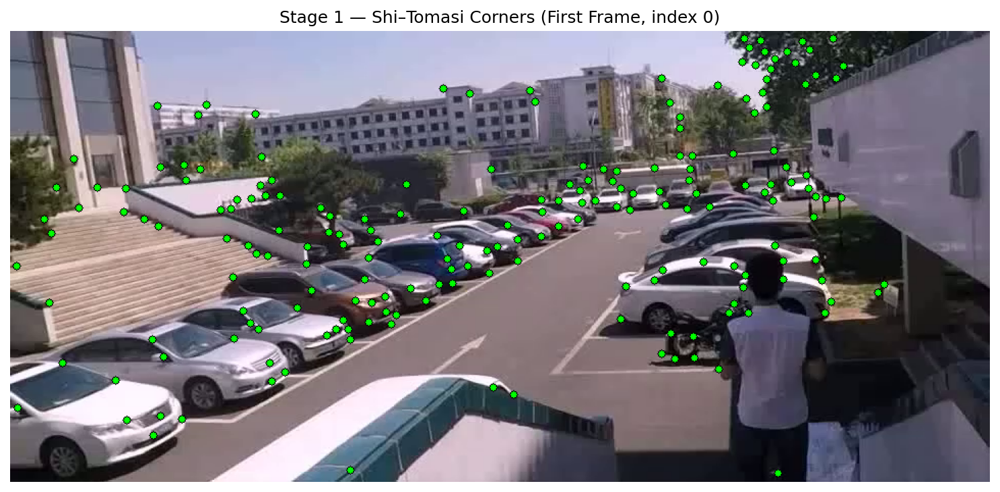

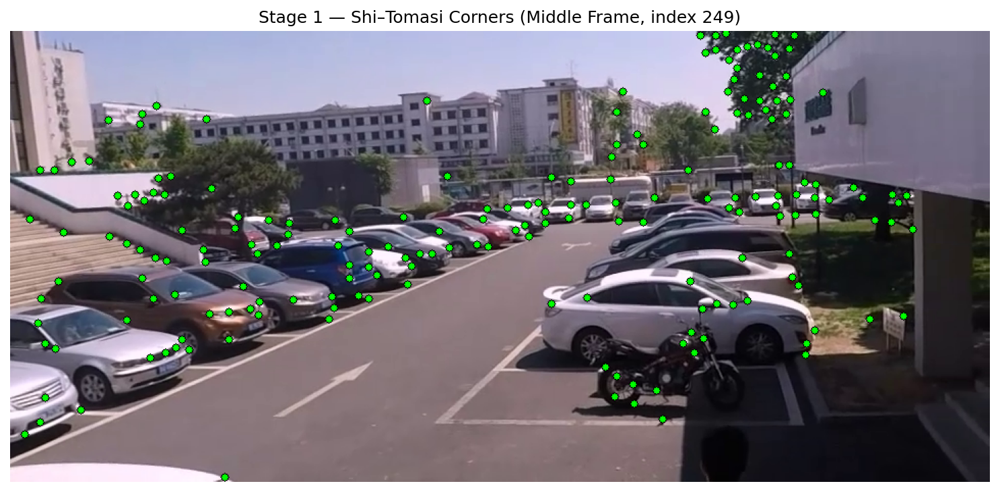

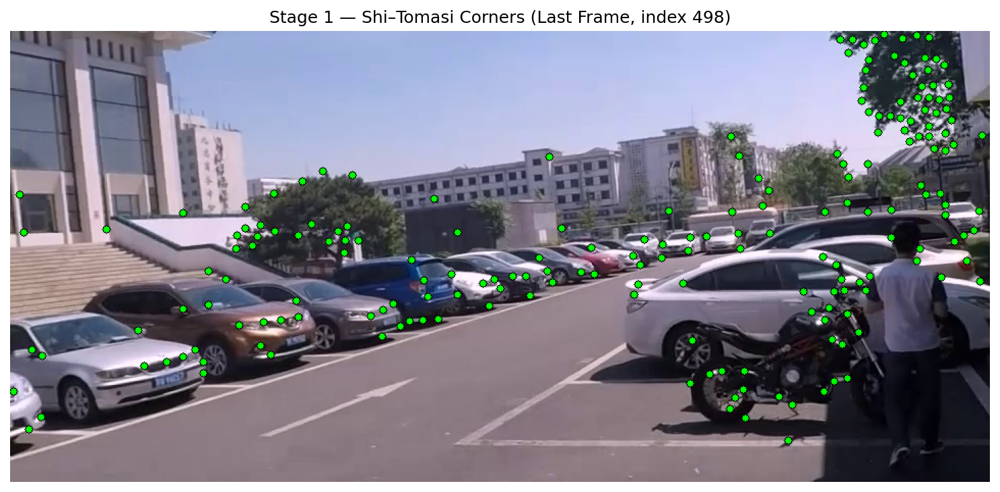

In [38]:
# Stage 1 — Shi–Tomasi corners (visible points + first / middle / last stills)
s1 = stage_dir(1, "Features")
v1 = s1 / f"{STEM}_stage1.mp4"

cap = cv2.VideoCapture(str(VIDEO_PATH))
fps = cap.get(cv2.CAP_PROP_FPS) or 30
frames_rgb = []
while True:
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    corners = cv2.goodFeaturesToTrack(
        gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
    )
    vis = frame.copy()
    if corners is not None:
        for pt in corners:
            x, y = pt.ravel()
            cv2.circle(vis, (int(x), int(y)), 3, (0, 255, 0), -1)
            cv2.circle(vis, (int(x), int(y)), 4, (0, 0, 0), 1)
    frames_rgb.append(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
cap.release()

save_mp4_rgb(frames_rgb, v1, fps)

n = len(frames_rgb)
if n == 0:
    raise RuntimeError("No frames in video")
idx_first, idx_mid, idx_last = 0, n // 2, n - 1
still_specs = [
    (idx_first, "first", "First Frame"),
    (idx_mid, "middle", "Middle Frame"),
    (idx_last, "last", "Last Frame"),
]
still_paths = []
for idx, slug, title in still_specs:
    fig_path = s1 / f"features_frame_{slug}.png"
    plt.figure(figsize=(10, 6))
    plt.imshow(frames_rgb[idx])
    plt.title(f"Stage 1 — Shi–Tomasi Corners ({title}, index {idx})")
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(fig_path, dpi=150, bbox_inches="tight")
    plt.close()
    still_paths.append(fig_path)

show_video(v1)
for p in still_paths:
    display(Image(filename=str(p)))

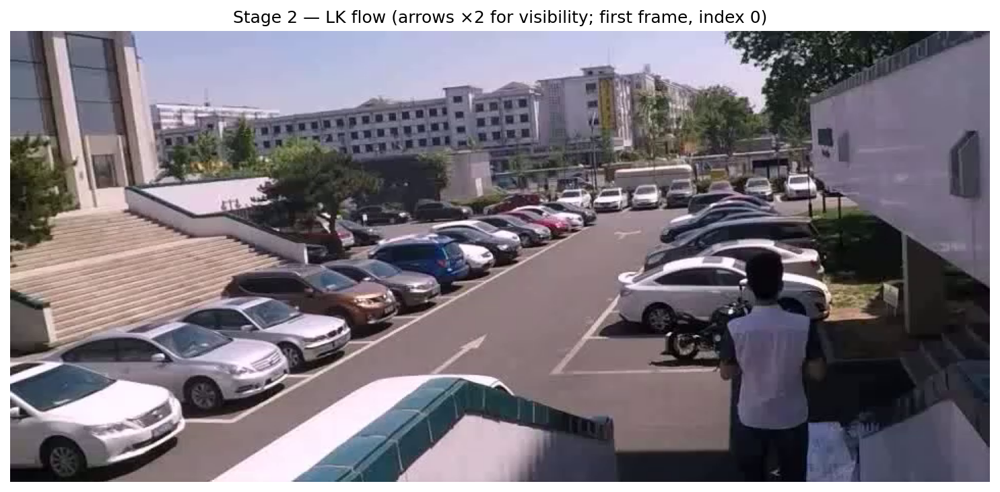

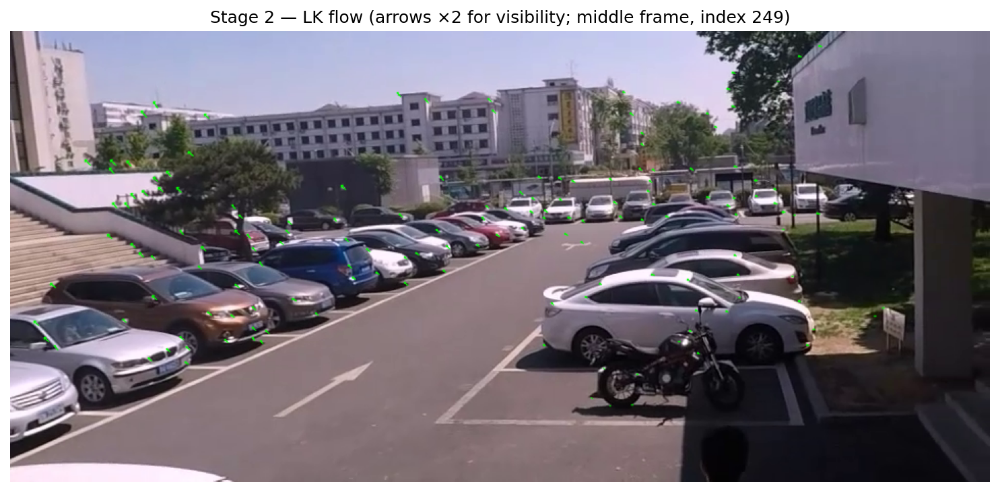

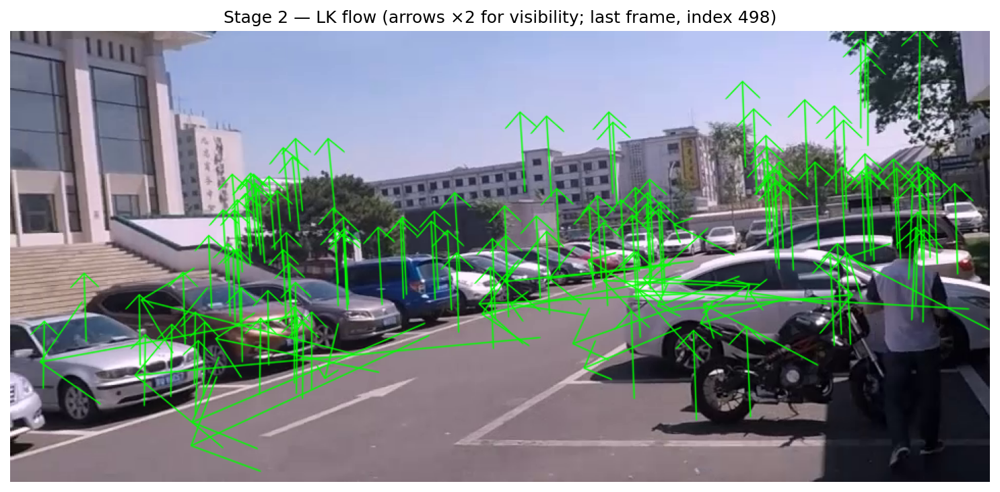

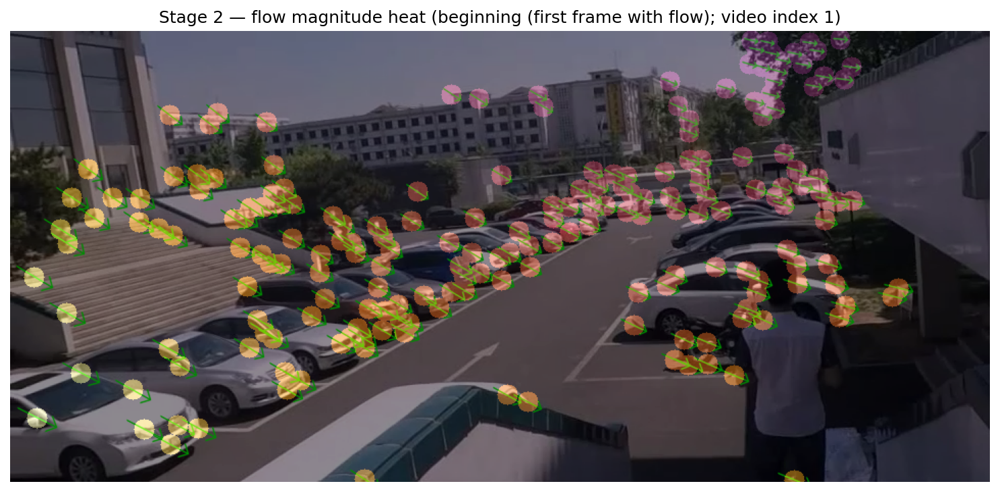

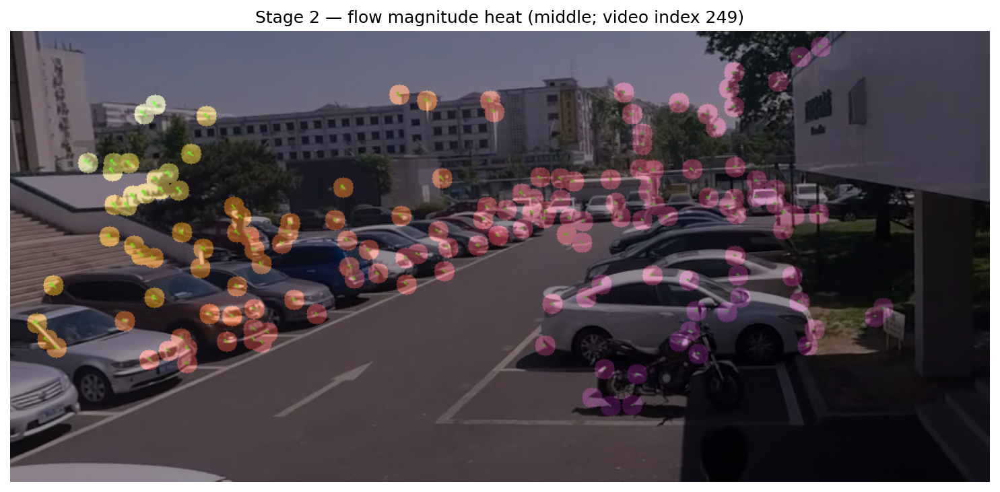

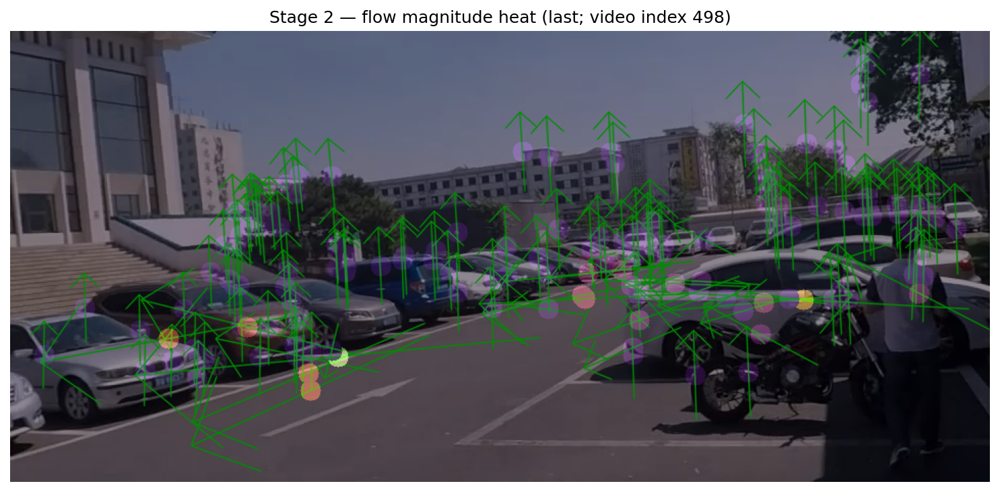

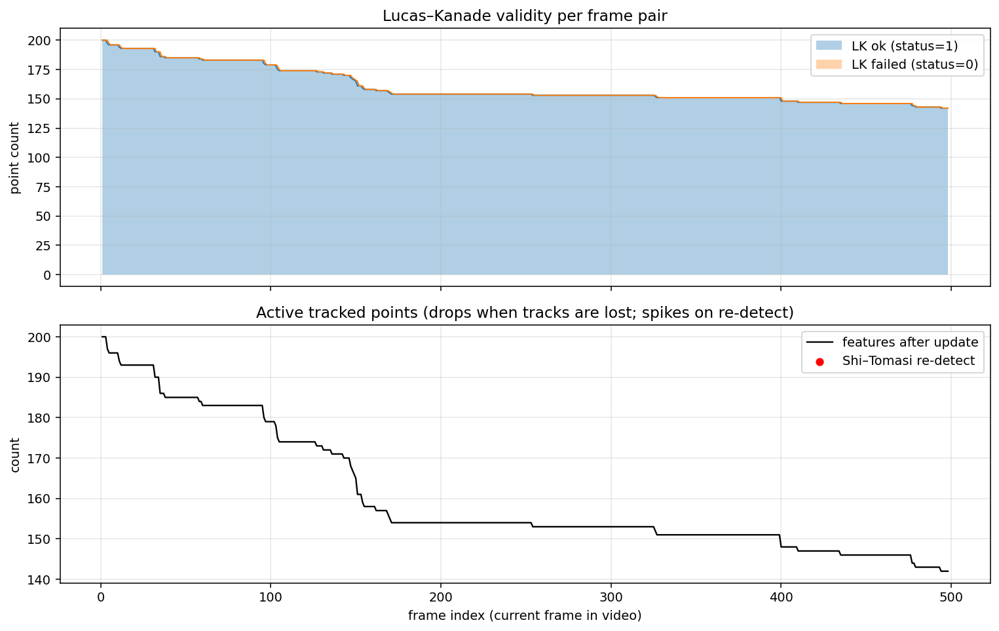

In [ ]:
# Stage 2 — Pyramidal Lucas–Kanade optical flow (arrows + stills + magnitude + LK validity)
s2 = stage_dir(2, "Optical Flow")
v2 = s2 / f"{STEM}_stage2.mp4"

# Short true displacements look like dots/pluses; scale only for drawing.
FLOW_ARROW_VIS_SCALE = 4.0
FLOW_ARROW_THICKNESS = 3


def draw_flow_arrows_vis(bgr, prev_xy, next_xy, scale=FLOW_ARROW_VIS_SCALE):
    """Draw LK displacements; scale length for visibility (physical motion unchanged elsewhere)."""
    P, Q = prev_xy.reshape(-1, 2), next_xy.reshape(-1, 2)
    for (x1, y1), (x2, y2) in zip(P, Q):
        dx, dy = float(x2 - x1), float(y2 - y1)
        ex = int(round(x1 + dx * scale))
        ey = int(round(y1 + dy * scale))
        cv2.arrowedLine(
            bgr,
            (int(x1), int(y1)),
            (ex, ey),
            (0, 255, 0),
            FLOW_ARROW_THICKNESS,
            line_type=cv2.LINE_AA,
            tipLength=0.28,
        )


def flow_magnitude_overlay(bgr_frame, prev_xy, next_xy, radius=10):
    """Heat overlay of |displacement| at tracked points (true scale, not vis scale)."""
    h, w = bgr_frame.shape[:2]
    acc = np.zeros((h, w), dtype=np.float32)
    if prev_xy is None or len(prev_xy) == 0:
        return bgr_frame
    P, Q = prev_xy.reshape(-1, 2), next_xy.reshape(-1, 2)
    mags = np.linalg.norm(Q - P, axis=1)
    for (x, y), m in zip(Q, mags):
        xi, yi = int(round(x)), int(round(y))
        cv2.circle(acc, (xi, yi), radius, float(m), -1)
    if acc.max() < 1e-6:
        return bgr_frame
    norm = np.clip(acc / acc.max(), 0, 1)
    heat = cv2.applyColorMap((norm * 255).astype(np.uint8), cv2.COLORMAP_INFERNO)
    return cv2.addWeighted(bgr_frame, 0.55, heat, 0.45, 0)

cap = cv2.VideoCapture(str(VIDEO_PATH))
fps = cap.get(cv2.CAP_PROP_FPS) or 30
ret, prev_frame = cap.read()
if not ret:
    raise RuntimeError("No frames")
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
prev_pts = cv2.goodFeaturesToTrack(
    prev_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
)
frames_rgb = [cv2.cvtColor(prev_frame, cv2.COLOR_BGR2RGB)]
flow_prev_snap = [None]
flow_next_snap = [None]

hist_frame = []
hist_lk_ok = []
hist_lk_fail = []
hist_active = []
hist_refreshed = []

frame_index = 0
while True:
    ret, curr_frame = cap.read()
    if not ret:
        break
    frame_index += 1
    curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_BGR2GRAY)
    vis = curr_frame.copy()
    refreshed = False
    n_ok = n_bad = None
    good_prev = good_next = None

    if prev_pts is not None and len(prev_pts) > 0:
        next_pts, status, _ = cv2.calcOpticalFlowPyrLK(
            prev_gray, curr_gray, prev_pts, None, **LK_PARAMS
        )
        if next_pts is not None:
            st = status.ravel()
            n_ok = int((st == 1).sum())
            n_bad = int((st == 0).sum())
            good_prev = prev_pts[status == 1]
            good_next = next_pts[status == 1]
            if len(good_prev) > 0:
                draw_flow_arrows_vis(vis, good_prev, good_next)
            prev_pts = good_next.reshape(-1, 1, 2).astype(np.float32)
            if len(prev_pts) < 50:
                prev_pts = cv2.goodFeaturesToTrack(
                    curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
                )
                refreshed = prev_pts is not None and len(prev_pts) > 0
        else:
            n_ok, n_bad = 0, len(prev_pts)
            prev_pts = cv2.goodFeaturesToTrack(
                curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
            )
            refreshed = prev_pts is not None and len(prev_pts) > 0
    else:
        prev_pts = cv2.goodFeaturesToTrack(
            curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
        )
        refreshed = prev_pts is not None and len(prev_pts) > 0

    hist_frame.append(frame_index)
    hist_lk_ok.append(0 if n_ok is None else n_ok)
    hist_lk_fail.append(0 if n_bad is None else n_bad)
    hist_active.append(0 if prev_pts is None else len(prev_pts))
    hist_refreshed.append(refreshed)

    if good_prev is not None and good_next is not None and len(good_prev) > 0:
        flow_prev_snap.append(good_prev.copy())
        flow_next_snap.append(good_next.copy())
    else:
        flow_prev_snap.append(None)
        flow_next_snap.append(None)

    prev_gray = curr_gray.copy()
    frames_rgb.append(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
cap.release()

save_mp4_rgb(frames_rgb, v2, fps)

n = len(frames_rgb)
if n == 0:
    raise RuntimeError("No frames in video")
idx_first, idx_mid, idx_last = 0, n // 2, n - 1

for idx, slug, title in [
    (idx_first, "first", "first frame"),
    (idx_mid, "middle", "middle frame"),
    (idx_last, "last", "last frame"),
]:
    p = s2 / f"optical_flow_frame_{slug}.png"
    plt.figure(figsize=(10, 6))
    plt.imshow(frames_rgb[idx])
    plt.title(
        f"Stage 2 — LK flow (arrows ×{FLOW_ARROW_VIS_SCALE:g} for visibility; {title}, index {idx})"
    )
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(p, dpi=150, bbox_inches="tight")
    plt.close()

if n > 1:
    for mag_idx, slug, label in [
        (1, "begin", "beginning (first frame with flow)"),
        (n // 2, "middle", "middle"),
        (n - 1, "end", "last"),
    ]:
        if mag_idx < 1 or mag_idx >= n:
            continue
        prv, nxt = flow_prev_snap[mag_idx], flow_next_snap[mag_idx]
        bgr = cv2.cvtColor(frames_rgb[mag_idx], cv2.COLOR_RGB2BGR)
        if prv is not None and nxt is not None:
            mag_vis = flow_magnitude_overlay(bgr, prv, nxt)
        else:
            mag_vis = bgr
        p = s2 / f"flow_magnitude_{slug}.png"
        plt.figure(figsize=(10, 6))
        plt.imshow(cv2.cvtColor(mag_vis, cv2.COLOR_BGR2RGB))
        plt.title(f"Stage 2 — flow magnitude heat ({label}; video index {mag_idx})")
        plt.axis("off")
        plt.tight_layout()
        plt.savefig(p, dpi=150, bbox_inches="tight")
        plt.close()

fig, ax = plt.subplots(2, 1, figsize=(11, 7), sharex=True)
hf = np.array(hist_frame, dtype=np.float64)
ok_a = np.array(hist_lk_ok, dtype=np.float64)
fail_a = np.array(hist_lk_fail, dtype=np.float64)
ax[0].fill_between(hf, 0, ok_a, alpha=0.35, label="LK ok (status=1)")
ax[0].fill_between(hf, ok_a, ok_a + fail_a, alpha=0.35, label="LK failed (status=0)")
ax[0].plot(hf, ok_a, lw=1)
ax[0].plot(hf, ok_a + fail_a, lw=1)
ax[0].set_ylabel("point count")
ax[0].set_title("Lucas–Kanade validity per frame pair")
ax[0].legend(loc="upper right")
ax[0].grid(True, alpha=0.3)
ax[1].plot(hf, hist_active, color="black", lw=1.2, label="features after update")
rfr = np.array(hist_refreshed)
ax[1].scatter(hf[rfr], np.array(hist_active)[rfr], c="red", s=28, zorder=3, label="Shi–Tomasi re-detect")
ax[1].set_ylabel("count")
ax[1].set_xlabel("frame index (current frame in video)")
ax[1].set_title("Active tracked points (drops when tracks are lost; spikes on re-detect)")
ax[1].legend(loc="upper right")
ax[1].grid(True, alpha=0.3)
plt.tight_layout()
vh = s2 / "lk_validity_and_tracks.png"
plt.savefig(vh, dpi=140, bbox_inches="tight")
plt.close()

show_video(v2)
for slug in ("first", "middle", "last"):
    display(Image(filename=str(s2 / f"optical_flow_frame_{slug}.png")))
for slug in ("begin", "middle", "end"):
    mp = s2 / f"flow_magnitude_{slug}.png"
    if mp.exists():
        display(Image(filename=str(mp)))
display(Image(filename=str(vh)))

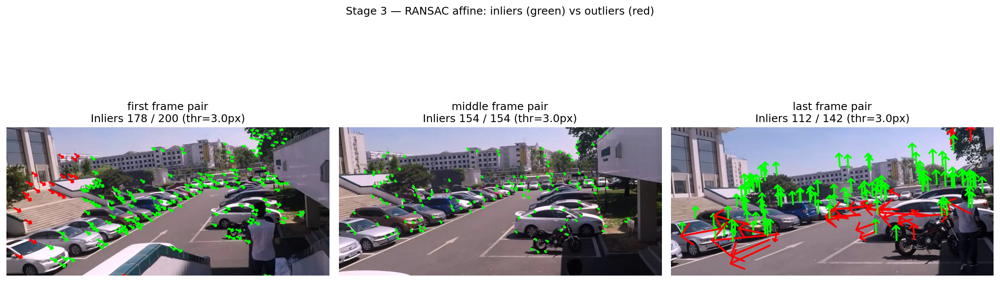

In [40]:
# Stage 3 — Motion estimation (RANSAC affine): video + first / middle / last inlier figure
s3 = stage_dir(3, "Motion Estimation")
v3 = s3 / f"{STEM}_stage3.mp4"

# Arrows are drawn on the **current** frame with tail at the tracked point in the current image
# and length |displacement|; short vectors are scaled up slightly so they stay visible in the video.
STAGE3_ARROW_THICKNESS = 4
STAGE3_ARROW_TIP_FRAC = 0.35
STAGE3_MIN_ARROW_LEN_PX = 6.0


def draw_ransac_flow_arrows(
    vis_bgr,
    good_prev,
    good_next,
    inliers,
    thickness=STAGE3_ARROW_THICKNESS,
    tip_frac=STAGE3_ARROW_TIP_FRAC,
    min_len=STAGE3_MIN_ARROW_LEN_PX,
):
    """Draw inlier/outlier displacement arrows on the current frame (BGR)."""
    for i, ((x1, y1), (x2, y2)) in enumerate(
        zip(good_prev.reshape(-1, 2), good_next.reshape(-1, 2))
    ):
        dx, dy = float(x2 - x1), float(y2 - y1)
        norm = (dx * dx + dy * dy) ** 0.5
        if norm < 1e-6:
            continue
        if norm < min_len:
            s = min_len / norm
            dx, dy = dx * s, dy * s
        x0, y0 = float(x2), float(y2)
        x1a, y1a = x0 + dx, y0 + dy
        color = (0, 255, 0) if inliers[i, 0] else (0, 0, 255)
        cv2.arrowedLine(
            vis_bgr,
            (int(round(x0)), int(round(y0))),
            (int(round(x1a)), int(round(y1a))),
            color,
            thickness,
            line_type=cv2.LINE_AA,
            tipLength=tip_frac,
        )


# --- Pass 1: frame count (for middle / last pair indices) ---
_cap_n = cv2.VideoCapture(str(VIDEO_PATH))
_nf = 0
while True:
    ok, _ = _cap_n.read()
    if not ok:
        break
    _nf += 1
_cap_n.release()
if _nf < 2:
    raise RuntimeError("Need at least 2 frames for motion estimation")
n_pairs = _nf - 1
pair_first, pair_mid, pair_last = 0, n_pairs // 2, n_pairs - 1
# Unique pair indices in order (short clips may collapse middle/last)
STAGE3_SNAPSHOT_SPEC = []
_seen_pairs = set()
for _pi, _lab in ((pair_first, "first"), (pair_mid, "middle"), (pair_last, "last")):
    if _pi not in _seen_pairs:
        STAGE3_SNAPSHOT_SPEC.append((_pi, _lab))
        _seen_pairs.add(_pi)
SNAPSHOT_PAIRS = _seen_pairs

cap = cv2.VideoCapture(str(VIDEO_PATH))
fps = cap.get(cv2.CAP_PROP_FPS) or 30
ret, prev_frame = cap.read()
if not ret:
    raise RuntimeError("No frames")
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
prev_pts = cv2.goodFeaturesToTrack(
    prev_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
)
frames_rgb = [cv2.cvtColor(prev_frame, cv2.COLOR_BGR2RGB)]
snapshots = {}
pair_i = 0
while True:
    ret, curr_frame = cap.read()
    if not ret:
        break
    curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_BGR2GRAY)
    vis = curr_frame.copy()
    if prev_pts is not None and len(prev_pts) > 0:
        next_pts, status, _ = cv2.calcOpticalFlowPyrLK(
            prev_gray, curr_gray, prev_pts, None, **LK_PARAMS
        )
        if next_pts is not None:
            good_prev = prev_pts[status == 1]
            good_next = next_pts[status == 1]
            if len(good_prev) >= 3:
                affine, inliers = cv2.estimateAffine2D(
                    good_prev, good_next, method=cv2.RANSAC, ransacReprojThreshold=INLIER_THRESH_PX
                )
                if affine is not None and inliers is not None:
                    draw_ransac_flow_arrows(vis, good_prev, good_next, inliers)
                    if pair_i in SNAPSHOT_PAIRS:
                        snap_vis = curr_frame.copy()
                        draw_ransac_flow_arrows(snap_vis, good_prev, good_next, inliers)
                        inl = int(inliers.sum())
                        tot = len(inliers)
                        for _pi, _lab in STAGE3_SNAPSHOT_SPEC:
                            if _pi == pair_i:
                                snapshots.setdefault(pair_i, []).append(
                                    (_lab, snap_vis.copy(), inl, tot)
                                )
            prev_pts = good_next.reshape(-1, 1, 2).astype(np.float32)
            if len(prev_pts) < 50:
                prev_pts = cv2.goodFeaturesToTrack(
                    curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
                )
        else:
            prev_pts = cv2.goodFeaturesToTrack(
                curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
            )
    else:
        prev_pts = cv2.goodFeaturesToTrack(
            curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
        )
    prev_gray = curr_gray.copy()
    prev_frame = curr_frame.copy()
    pair_i += 1
    frames_rgb.append(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
cap.release()

save_mp4_rgb(frames_rgb, v3, fps)
show_video(v3)

# Single figure: inliers (green) vs outliers (red) at first / middle / last frame pair
flat_snaps = []
for _pi, _lab in STAGE3_SNAPSHOT_SPEC:
    if _pi in snapshots:
        for lab, snap_bgr, inl, tot in snapshots[_pi]:
            if lab == _lab:
                flat_snaps.append((lab, snap_bgr, inl, tot))
                break
if flat_snaps:
    fig, axes = plt.subplots(1, len(flat_snaps), figsize=(5.2 * len(flat_snaps), 5.5))
    if len(flat_snaps) == 1:
        axes = [axes]
    for ax, (label, snap_bgr, inl, tot) in zip(axes, flat_snaps):
        ax.imshow(cv2.cvtColor(snap_bgr, cv2.COLOR_BGR2RGB))
        ax.set_title(f"{label} frame pair\nInliers {inl} / {tot} (thr={INLIER_THRESH_PX}px)")
        ax.axis("off")
    plt.suptitle("Stage 3 — RANSAC affine: inliers (green) vs outliers (red)", y=1.02)
    plt.tight_layout()
    inl_path = s3 / "ransac_inliers_outliers_keyframes.png"
    plt.savefig(inl_path, dpi=150, bbox_inches="tight")
    plt.close()
    display(Image(filename=str(inl_path)))
else:
    print("Stage 3: no RANSAC snapshots (insufficient tracks?)")


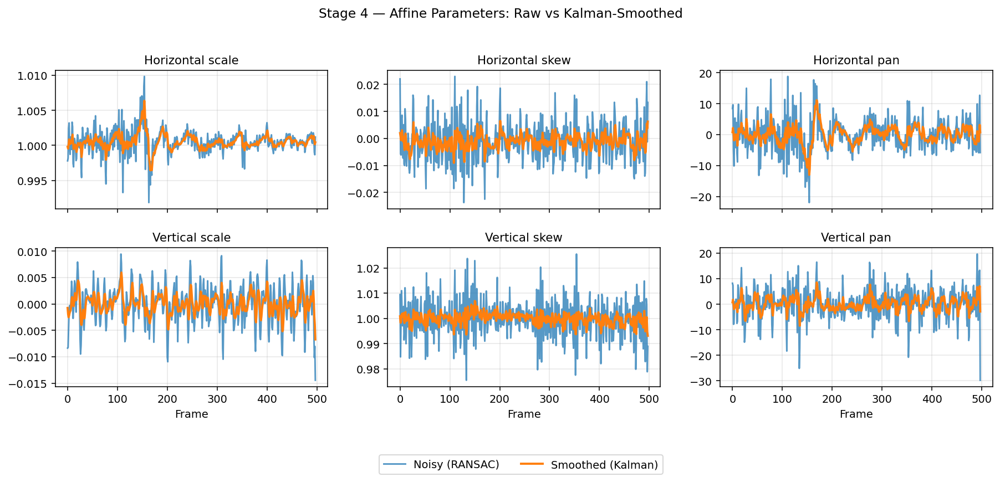

In [41]:
# Stage 4 — Temporal smoothing (Kalman on 6 affine parameters) + parameter plot
s4 = stage_dir(4, "Smoothing")
v4 = s4 / f"{STEM}_stage4.mp4"

# Grid arrows show the smoothed affine field; scale up displacements for visibility (direction unchanged).
STAGE4_GRID_ARROW_THICKNESS = 4
STAGE4_GRID_ARROW_TIP = 0.38
STAGE4_GRID_DISP_SCALE = 2.5
STAGE4_GRID_COLOR = (0, 255, 255)

# Subplot titles (OpenCV row-major 2×3: top row = how x′ is built, bottom = how y′ is built).
AFFINE_PARAM_TITLES = [
    "Horizontal scale",
    "Horizontal skew",
    "Horizontal pan",
    "Vertical scale",
    "Vertical skew",
    "Vertical pan",
]


def affine_to_vec(M):
    if M is None:
        return np.array([[1], [0], [0], [0], [1], [0]], dtype=np.float32)
    return M.reshape(6, 1).astype(np.float32)


def vec_to_affine(v):
    return v.reshape(2, 3)

cap = cv2.VideoCapture(str(VIDEO_PATH))
fps = cap.get(cv2.CAP_PROP_FPS) or 30
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
ret, prev_frame = cap.read()
if not ret:
    raise RuntimeError("No frames")
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
prev_pts = cv2.goodFeaturesToTrack(
    prev_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
)
kf = cv2.KalmanFilter(6, 6, 0)
kf.transitionMatrix = np.eye(6, dtype=np.float32)
kf.measurementMatrix = np.eye(6, dtype=np.float32)
kf.processNoiseCov = np.eye(6, dtype=np.float32) * 0.01
kf.measurementNoiseCov = np.eye(6, dtype=np.float32) * 0.1
kf.statePost = np.array([[1], [0], [0], [0], [1], [0]], dtype=np.float32)

raw_rows = []
smooth_rows = []
grid_step = 60
frames_rgb = [cv2.cvtColor(prev_frame, cv2.COLOR_BGR2RGB)]
while True:
    ret, curr_frame = cap.read()
    if not ret:
        break
    curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_BGR2GRAY)
    affine_raw = None
    if prev_pts is not None and len(prev_pts) > 0:
        next_pts, status, _ = cv2.calcOpticalFlowPyrLK(
            prev_gray, curr_gray, prev_pts, None, **LK_PARAMS
        )
        if next_pts is not None:
            good_prev = prev_pts[status == 1]
            good_next = next_pts[status == 1]
            if len(good_prev) >= 3:
                affine_raw, _ = cv2.estimateAffine2D(
                    good_prev, good_next, method=cv2.RANSAC, ransacReprojThreshold=INLIER_THRESH_PX
                )
            prev_pts = good_next.reshape(-1, 1, 2).astype(np.float32)
            if len(prev_pts) < 50:
                prev_pts = cv2.goodFeaturesToTrack(
                    curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
                )
        else:
            prev_pts = cv2.goodFeaturesToTrack(
                curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
            )
    else:
        prev_pts = cv2.goodFeaturesToTrack(
            curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
        )

    z = affine_to_vec(affine_raw)
    raw_rows.append(z.flatten())
    kf.predict()
    kf.correct(z)
    M_smooth = vec_to_affine(kf.statePost)
    smooth_rows.append(kf.statePost.flatten())

    vis = curr_frame.copy()
    for gy in range(0, h, grid_step):
        for gx in range(0, w, grid_step):
            p = np.array([[[gx, gy]]], dtype=np.float32)
            q = cv2.transform(p, M_smooth)[0, 0]
            dx, dy = float(q[0] - gx), float(q[1] - gy)
            dx *= STAGE4_GRID_DISP_SCALE
            dy *= STAGE4_GRID_DISP_SCALE
            x1, y1 = int(round(gx)), int(round(gy))
            x2, y2 = int(round(gx + dx)), int(round(gy + dy))
            if x1 == x2 and y1 == y2:
                continue
            cv2.arrowedLine(
                vis,
                (x1, y1),
                (x2, y2),
                STAGE4_GRID_COLOR,
                STAGE4_GRID_ARROW_THICKNESS,
                line_type=cv2.LINE_AA,
                tipLength=STAGE4_GRID_ARROW_TIP,
            )
    prev_gray = curr_gray.copy()
    frames_rgb.append(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
cap.release()

save_mp4_rgb(frames_rgb, v4, fps)
show_video(v4)

if raw_rows:
    Rm = np.array(raw_rows)
    Sm = np.array(smooth_rows)
    fig, axs = plt.subplots(2, 3, figsize=(13, 6.0), sharex=True)
    legend_handles = None
    for ax, j, title in zip(axs.ravel(), range(6), AFFINE_PARAM_TITLES):
        (h0,) = ax.plot(Rm[:, j], color="C0", alpha=0.75, label="Noisy (RANSAC)")
        (h1,) = ax.plot(Sm[:, j], color="C1", linewidth=2.0, label="Smoothed (Kalman)")
        if legend_handles is None:
            legend_handles = [h0, h1]
        ax.set_title(title, fontsize=11)
        ax.grid(True, alpha=0.3)
    for ax in axs[0]:
        ax.tick_params(labelbottom=False)
    for ax in axs[1]:
        ax.set_xlabel("Frame")
    fig.legend(
        legend_handles,
        [h.get_label() for h in legend_handles],
        loc="lower center",
        bbox_to_anchor=(0.52, -0.02),
        ncol=2,
        frameon=True,
        fontsize=10,
    )
    plt.suptitle("Stage 4 — Affine Parameters: Raw vs Kalman-Smoothed", fontsize=12, y=0.995)
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.18, top=0.86, wspace=0.22, hspace=0.28)
    p_path = s4 / "kalman_affine_parameters.png"
    plt.savefig(p_path, dpi=140, bbox_inches="tight")
    plt.close()
    display(Image(filename=str(p_path)))


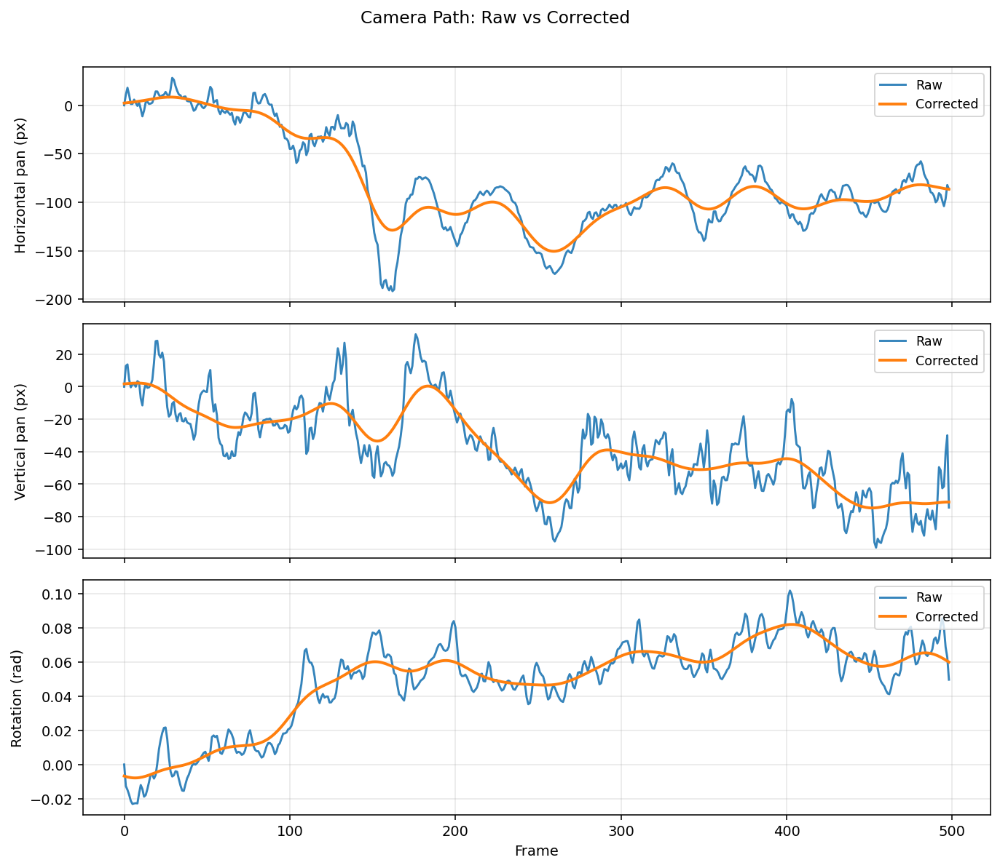

In [42]:
# Stage 5 — Full stabilization path (similarity + Gaussian path smooth) + crop + trajectory figure
s5 = stage_dir(5, "Warp and Crop")
v5 = s5 / f"{STEM}_stage5.mp4"


def pass_stabilization(cap, smooth_sigma=PATH_SMOOTH_SIGMA_FRAMES):
    fps = cap.get(cv2.CAP_PROP_FPS) or 30
    h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    ret, prev_frame = cap.read()
    if not ret:
        raise RuntimeError("No frames")
    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
    prev_pts = cv2.goodFeaturesToTrack(
        prev_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
    )
    As = []
    while True:
        ret, curr_frame = cap.read()
        if not ret:
            break
        curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_BGR2GRAY)
        affine_raw = None
        if prev_pts is not None and len(prev_pts) > 0:
            next_pts, status, _ = cv2.calcOpticalFlowPyrLK(
                prev_gray, curr_gray, prev_pts, None, **LK_PARAMS
            )
            if next_pts is not None:
                good_prev = prev_pts[status == 1]
                good_next = next_pts[status == 1]
                if len(good_prev) >= 2:
                    affine_raw, _ = cv2.estimateAffinePartial2D(
                        good_prev, good_next, method=cv2.RANSAC
                    )
                prev_pts = good_next.reshape(-1, 1, 2).astype(np.float32)
                if len(prev_pts) < 50:
                    prev_pts = cv2.goodFeaturesToTrack(
                        curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
                    )
            else:
                prev_pts = cv2.goodFeaturesToTrack(
                    curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
                )
        else:
            prev_pts = cv2.goodFeaturesToTrack(
                curr_gray, maxCorners=MAX_CORNERS, qualityLevel=QUALITY_LEVEL, minDistance=MIN_DISTANCE
            )
        As.append(to_3x3(affine_raw))
        prev_gray = curr_gray.copy()
    Rs = [np.eye(3, dtype=np.float64)]
    for A in As:
        Rs.append(Rs[-1] @ A)
    Qs = similarity_Qs_from_cumulative_Rs(Rs, smooth_sigma)
    Ms = []
    for i in range(1, len(Rs)):
        M_warp = to_2x3(Qs[i] @ np.linalg.inv(Rs[i]))
        Ms.append(M_warp.astype(np.float32))
    return fps, h, w, Rs, Qs, Ms

cap = cv2.VideoCapture(str(VIDEO_PATH))
try:
    fps, h, w, Rs, Qs, Ms = pass_stabilization(cap)
finally:
    cap.release()

x1, y1, x2, y2 = adaptive_crop_from_warps(Ms, w, h)
cap = cv2.VideoCapture(str(VIDEO_PATH))
try:
    ret, prev_frame = cap.read()
    if not ret:
        raise RuntimeError("No frames")
    frames = [cv2.cvtColor(prev_frame[y1:y2, x1:x2], cv2.COLOR_BGR2RGB)]
    mi = 0
    while True:
        ret, curr_frame = cap.read()
        if not ret:
            break
        warped = cv2.warpAffine(
            curr_frame,
            Ms[mi],
            (w, h),
            flags=cv2.INTER_LINEAR,
            borderMode=cv2.BORDER_REPLICATE,
        )
        mi += 1
        frames.append(cv2.cvtColor(warped[y1:y2, x1:x2], cv2.COLOR_BGR2RGB))
finally:
    cap.release()

save_mp4_rgb(frames, v5, fps)
show_video(v5)

tx_r = np.array([float(R[0, 2]) for R in Rs])
ty_r = np.array([float(R[1, 2]) for R in Rs])
th_r = np.unwrap(np.array([np.arctan2(float(R[1, 0]), float(R[0, 0])) for R in Rs]))
tx_q = np.array([float(Q[0, 2]) for Q in Qs])
ty_q = np.array([float(Q[1, 2]) for Q in Qs])
th_q = np.unwrap(np.array([np.arctan2(float(Q[1, 0]), float(Q[0, 0])) for Q in Qs]))
fig, ax = plt.subplots(3, 1, figsize=(10, 8.4), sharex=True)
raw_kw = dict(color="tab:blue", label="Raw", alpha=0.9)
corr_kw = dict(color="tab:orange", label="Corrected", linewidth=2.0)
ax[0].plot(tx_r, **raw_kw)
ax[0].plot(tx_q, **corr_kw)
ax[0].set_ylabel("Horizontal pan (px)")
ax[0].grid(True, alpha=0.3)
ax[0].legend(loc="upper right", fontsize=9)
ax[1].plot(ty_r, **raw_kw)
ax[1].plot(ty_q, **corr_kw)
ax[1].set_ylabel("Vertical pan (px)")
ax[1].grid(True, alpha=0.3)
ax[1].legend(loc="upper right", fontsize=9)
ax[2].plot(th_r, **raw_kw)
ax[2].plot(th_q, **corr_kw)
ax[2].set_ylabel("Rotation (rad)")
ax[2].set_xlabel("Frame")
ax[2].grid(True, alpha=0.3)
ax[2].legend(loc="upper right", fontsize=9)
plt.suptitle("Camera Path: Raw vs Corrected", fontsize=12, y=1.01)
plt.tight_layout()
traj_path = s5 / "stabilization_path_raw_vs_corrected.png"
plt.savefig(traj_path, dpi=140, bbox_inches="tight")
plt.close()
display(Image(filename=str(traj_path)))

In [43]:
# Stage 6 — Side-by-side comparison (original vs stabilized)
s6 = stage_dir(6, "Comparison")
v6 = s6 / f"{STEM}_stage6.mp4"

stab_path = v5
cap_orig = cv2.VideoCapture(str(VIDEO_PATH))
cap_stab = cv2.VideoCapture(str(stab_path))
fps = cap_orig.get(cv2.CAP_PROP_FPS) or 30
h_orig = int(cap_orig.get(cv2.CAP_PROP_FRAME_HEIGHT))
w_orig = int(cap_orig.get(cv2.CAP_PROP_FRAME_WIDTH))
frames = []
while True:
    ret_o, frame_o = cap_orig.read()
    ret_s, frame_s = cap_stab.read()
    if not ret_o or not ret_s:
        break
    h_s, w_s = frame_s.shape[:2]
    if h_s != h_orig:
        frame_s = cv2.resize(frame_s, (int(w_s * h_orig / h_s), h_orig))
    cv2.putText(frame_o, "Original", (10, 32), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), 2)
    cv2.putText(frame_s, "Stabilized", (10, 32), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), 2)
    side_by_side = cv2.hconcat([frame_o, frame_s])
    frames.append(cv2.cvtColor(side_by_side, cv2.COLOR_BGR2RGB))
cap_orig.release()
cap_stab.release()

save_mp4_rgb(frames, v6, fps)
show_video(v6)